# Detecting a rotated chest X-ray (CXR) image is crucial for proper medical analysis and automated diagnostics. There are several techniques that can be used to identify and correct rotated X-ray images:
1. Deep Learning-Based Approaches

✅ Best for large datasets & high accuracy

    Convolutional Neural Networks (CNNs):
        Train a CNN to classify images as "rotated" or "correctly oriented."
        Example architectures: ResNet, VGG, EfficientNet.
    Autoencoders / Self-Supervised Learning:
        An autoencoder can learn normal orientations and identify when an image is misaligned.
        Contrastive learning (e.g., SimCLR, MoCo) can learn representations and detect rotation.

🔹 Example:

    Train a CNN classifier on CXR images labeled with different rotation angles (e.g., 0°, 90°, 180°, 270°).
    The model predicts whether an image is rotated and suggests corrections.

2. Classical Computer Vision Techniques

✅ Good for small datasets & fast processing
A. Edge Detection & Keypoint Detection

    Hough Line Transform:
        Detects vertical and horizontal structures in X-rays.
        If the lung boundaries or clavicles are tilted, the image is likely rotated.
    Harris Corner Detector / SIFT / ORB Features:
        Extract keypoints (e.g., rib cage edges) and compare them with known orientations.

B. Symmetry-Based Methods

    Lungs and spine are normally symmetrical in frontal CXR.
    Use symmetry detection:
        Histogram of oriented gradients (HOG)
        Radon transform (detects dominant line orientations)
        Fourier transform-based alignment (checks for dominant vertical structures)

C. PCA (Principal Component Analysis)

    Compute the principal axis of the lung region.
    If the major axis is significantly tilted, the image is rotated.

3. Template Matching

✅ Useful when reference images are available

    Compare an input X-ray with a set of correctly aligned reference images.
    Use cross-correlation or structural similarity index (SSIM) to measure alignment.
    If misalignment is detected, rotate the image until it best matches the reference.

4. Statistical Methods

    Compute the intensity profile along the vertical axis:
        Normally, pixel intensity distribution should be symmetrical.
        If the distribution is skewed, the image might be rotated.
    Gradient orientation histograms:
        In a correctly oriented image, most gradients should be vertical.
        Rotation causes shifts in the gradient histogram.

Which Method to Use?
<table data-start="2634" data-end="3127"><thead data-start="2634" data-end="2673"><tr data-start="2634" data-end="2673"><th data-start="2634" data-end="2650"><strong data-start="2636" data-end="2649">Technique</strong></th><th data-start="2650" data-end="2661"><strong data-start="2652" data-end="2660">Pros</strong></th><th data-start="2661" data-end="2673"><strong data-start="2663" data-end="2671">Cons</strong></th></tr></thead><tbody data-start="2711" data-end="3127"><tr data-start="2711" data-end="2797"><td>CNN-based detection</td><td>High accuracy, generalizable</td><td>Needs labeled data &amp; training</td></tr><tr data-start="2798" data-end="2883"><td>Hough Line Transform</td><td>Fast, detects rotations well</td><td>Struggles with noisy images</td></tr><tr data-start="2884" data-end="2969"><td>PCA-based</td><td>No training needed, works on symmetry</td><td>Fails if lungs are asymmetric</td></tr><tr data-start="2970" data-end="3057"><td>Radon Transform</td><td>Effective for detecting skewed images</td><td>Computationally expensive</td></tr><tr data-start="3058" data-end="3127"><td>Template Matching</td><td>Easy to implement</td><td>Requires reference images</td></tr></tbody></table>

# ===============================================
# CNN-based detection with downscaled xray images
# ===============================================

* ## Downscaling the image
Best Interpolation for Downscaling X-ray Images

For medical images, preserving details is crucial. The best interpolation method is:

✅ cv2.INTER_AREA → Best for downscaling (avoids aliasing & preserves details).

This method averages pixel values, making it ideal for medical imaging where preserving structures is critical.

In [1]:
%load_ext autoreload
%autoreload 2

# ensure the notebook reloads the updated .py modules when importing them

In [ ]:
from src.utils.img_processing import ImageProcessor
import cv2
import matplotlib.pyplot as plt

## Prepare dowscaled data to train the CNN model to determine the image orientaion
1. Downscaling of the original images
2. removing duplicates
3. Creating test and traning data

In [5]:
# 1. Dowsncaling
from src.utils.img_processing import ImageProcessor
from src.defs import IMAGE_DIRECTORIES as imdir, DiseaseCategory as dc

ip = ImageProcessor()

new_size = (75, 75)

for disease in dc:
    inFolder = fr"C:\Users\User\DataScience\area51\data\COVID-19_Radiography_Dataset\{disease.value}\images"
    outFolder = fr"C:\Users\User\DataScience\area51\data\COVID-19_Radiography_Dataset\{disease.value}\downscaled"
    ip.downscaleToFolder(inputFolder=inFolder, outputFolder=outFolder, new_size=new_size)


1345 images have been downscaled and stored to C:\Users\User\DataScience\area51\data\COVID-19_Radiography_Dataset\Viral Pneumonia\downscaled\75x75
3616 images have been downscaled and stored to C:\Users\User\DataScience\area51\data\COVID-19_Radiography_Dataset\COVID\downscaled\75x75
6012 images have been downscaled and stored to C:\Users\User\DataScience\area51\data\COVID-19_Radiography_Dataset\Lung_Opacity\downscaled\75x75
10192 images have been downscaled and stored to C:\Users\User\DataScience\area51\data\COVID-19_Radiography_Dataset\Normal\downscaled\75x75


In [ ]:
# 2. removing duplicates

# remove duplicated images for each category in downscaled folders
import os, pandas as pd
from src.defs import DiseaseCategory as dc

# prepare a list having images to be removed
df_duplicates_only = pd.read_csv(r"C:\Users\User\DataScience\area51\data\COVID-19_Radiography_Dataset\3_image_duplicates_only.csv")
df_duplicates_to_remove = df_duplicates_only[df_duplicates_only['mean intensity'].duplicated(keep='first')]
duplicated_images_to_remove = df_duplicates_to_remove["file name"] + '.png'
duplicated_images_to_remove = duplicated_images_to_remove.to_list()

# removing duplicated images from the dataset

img_removed = []	# List to store removed images

for cat in dc:
    #set the base directory
    img_dir = fr"C:\Users\User\DataScience\area51\data\COVID-19_Radiography_Dataset\{cat.value}\downscaled\75x75"
    
    # Iterate through all images in the directory
    all_images = [img for img in os.listdir(img_dir) if img.endswith('.png')]

    # Remove matching files
    for filename in duplicated_images_to_remove:
        file_path = os.path.join(img_dir, "75x75_"+filename)
        if os.path.exists(file_path):
            os.remove(file_path)
            img_removed.append(filename)

print("duplicates to remove:", len(duplicated_images_to_remove), duplicated_images_to_remove)
print("removed duplicates:", len(img_removed), img_removed)

In [ ]:
# 3. Creating test and traning data

# manual selection (visual control) of vertically oriented images to
# C:\Users\User\DataScience\area51\data_75x75\data_image_rotation\75x75_rotated_0

import os
import cv2

# rotate images from the sourceFolder by +90/-90/180° and store to targetFolder

sourceFolder = r"C:\Users\User\DataScience\area51\data_75x75\data_image_rotation\75x75_rotated_0" # manually selected images

targetFolders = (r"C:\Users\User\DataScience\area51\data_75x75\data_image_rotation\75x75_rotated_+90",
                 r"C:\Users\User\DataScience\area51\data_75x75\data_image_rotation\75x75_rotated_-90",
                 r"C:\Users\User\DataScience\area51\data_75x75\data_image_rotation\75x75_rotated_180")


# List all files from sourceFolder
all_images = [img for img in os.listdir(sourceFolder) if img.lower().endswith((".png"))]

# rotate
for targetFolder, angle in zip(targetFolders, (90, -90, 180)):
    if not os.path.exists(targetFolder):
        os.makedirs(targetFolder)
    # Rotate and save images
    for image_name in all_images:
        img_path = os.path.join(sourceFolder, image_name)
        image = cv2.imread(img_path)

        # Rotate image
        if angle == 90:
            rotated_img = cv2.rotate(image, cv2.ROTATE_90_CLOCKWISE)
        elif angle == -90:
            rotated_img = cv2.rotate(image, cv2.ROTATE_90_COUNTERCLOCKWISE)
        elif angle == 180:
            rotated_img = cv2.rotate(image, cv2.ROTATE_180)  # or cv2.flip(image, -1)
        else:
            pass

        # Save rotated image to target folder
        target_path = os.path.join(targetFolder, f"rotated_{angle}_{image_name}")
        cv2.imwrite(target_path, rotated_img)



# CNN Orientation Classification using ResNet
* create-->fit-->validate-->save results

In [1]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Input
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import numpy as np
import os
import json


In [ ]:

"""
1. Real-time Data Loading:

    * Reads images directly from folders in batches.
    * Useful when datasets don't fit entirely into memory.
    * --> Automatically assigns labels based on folder structure.
    
dataset/
├── 75x75_rotated_0/
│   ├── image1.png
│   ├── image2.png
│   └── ...
└── 75x75_rotated_90/
    ├── image101.png
    ├── image102.png
    └── ...
"""


# Define parameters
img_height, img_width = 75, 75
batch_size = 32
epochs = 20

# Data paths
train_data_dir = r"C:\Users\User\DataScience\area51\data_75x75\data_image_rotation"  # Path to your dataset folder

# parameter for image data generator for real-time data loading
dataGenParams = {
    "dataGen_1": {
        "rescale": 1./255,
        "validation_split": 0.2,
    },
    "dataGen_2": {
        "rescale": 1./255,
        "validation_split": 0.2,
        "rotation_range": 5, # +/-5°
        "width_shift_range": 0.1,  # +/-10%
        "height_shift_range": 0.1 # +/-10%
    }
}


# two augmentation strategies: dataGen_1 and dataGen_2
for dataGenParamSet in dataGenParams:
    
    resnet_1_model_dir = fr"C:\Users\User\DataScience\area51\models\resnet\resnet_1\{dataGenParamSet}"

    if not os.path.exists(resnet_1_model_dir):
        os.makedirs(resnet_1_model_dir)

    # Data preparation --> Automatically assigns labels based on folder structure
    train_datagen = ImageDataGenerator(**dataGenParams[dataGenParamSet])

    train_generator = train_datagen.flow_from_directory(
        train_data_dir,
        target_size=(img_height, img_width),
        color_mode='grayscale',
        batch_size=batch_size,
        class_mode='categorical',
        subset='training'
    )

    validation_generator = train_datagen.flow_from_directory(
        train_data_dir,
        target_size=(img_height, img_width),
        color_mode='grayscale',
        batch_size=batch_size,
        class_mode='categorical',
        subset='validation'
    )

    # Build ResNet Model
    base_model = ResNet50(weights=None, include_top=False, input_tensor=Input(shape=(img_height, img_width, 1)))

    model = Sequential([
        base_model,
        GlobalAveragePooling2D(),
        Dense(128, activation='relu'),
        Dense(4, activation='softmax')  # 4 labels: 0, +90, -90, 180
    ])

    model.compile(optimizer=Adam(learning_rate=0.0001),
                loss='categorical_crossentropy',
                metrics=['accuracy'])


    # --use this callbacks to stop at certain val_accuracy--------------------------------------------

    # from tensorflow.keras.callbacks import EarlyStopping

    # #----defining train-stop-callback with the target val_acccuracy
    # early_stop = EarlyStopping(
    #     monitor='val_accuracy',  # monitor validation accuracy
    #     patience=2,              # wait for 5 epochs to confirm no improvement (optional)
    #     verbose=1,
    #     mode='max',              # higher val_accuracy is better
    #     restore_best_weights=True
    # )

    class StopAtValAccuracy(tf.keras.callbacks.Callback):
        def __init__(self, target_val_accuracy=0.95):
            super().__init__()
            self.target_val_accuracy = target_val_accuracy

        def on_epoch_end(self, epoch, logs=None):
            val_accuracy = logs.get("val_accuracy")
            if val_accuracy is not None:
                if val_accuracy >= self.target_val_accuracy:
                    print(f"\nReached target validation accuracy of {self.target_val_accuracy*100:.2f}% at epoch {epoch+1}. Stopping training.")
                    self.model.stop_training = True

    # stop when val_accuracy reaches 
    target_val_acc = 0.98

    #---------Train model----------------
    # train order is given by folder oder in train_data_dir:
    #  '75x75_rotated_+90': 0,
    #  '75x75_rotated_-90': 1,
    #  '75x75_rotated_0': 2,
    #  '75x75_rotated_180': 3

    history = model.fit(
        train_generator,
        epochs=epochs,
        validation_data=validation_generator,
        callbacks=[StopAtValAccuracy(target_val_accuracy=target_val_acc)]  # early_stop
    )

    # Evaluate on validation data
    val_loss, val_accuracy = model.evaluate(validation_generator)
    print(f'Validation accuracy: {val_accuracy:.2%}')

    #-----storing reslts to files: model, dataGenParams, training history------------------------------------------------------------

    import os
    import json

    # save Validation accuracy/loss
    v_metrics = {
        "val_loss": val_loss,
        "val_accuracy": val_accuracy
    }
    v_path = os.path.join(resnet_1_model_dir, f'validation_accuracy_loss_resnet_1_{dataGenParamSet}.json')
    with open(v_path, 'w') as f:
        json.dump(v_metrics, f)

    # Save the model
    model_path = os.path.join(resnet_1_model_dir, f'orientation_classifier_resnet_1_{dataGenParamSet}.keras')
    model.save(model_path)

    # save dataGenParams used
    dataGenParams_path = os.path.join(resnet_1_model_dir, f'dataGenParams_{dataGenParamSet}.json')
    with open(dataGenParams_path, 'w') as f:
        json.dump(dataGenParams[dataGenParamSet], f)

    # Save training history: accuracy and loss for each epoch
    history_path = os.path.join(resnet_1_model_dir, f'training_history_resnet_1_{dataGenParamSet}.json')
    with open(history_path, 'w') as f:
        json.dump(history.history, f)

# Loading saved model, dataGenParams, training history, evaluation results
* show model parameters and accuracy

Data generator parameters are being used for training: dataGen_1


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ (None, 3, 3, 2048)     │    23,581,440 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       262,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 71,426,446 (272.47 MB)

 Trainable params: 23,791,108 (90.76 MB)

 Non-trainable params: 53,120 (207.50 KB)

 Optimizer params: 47,582,218 (181.51 MB)

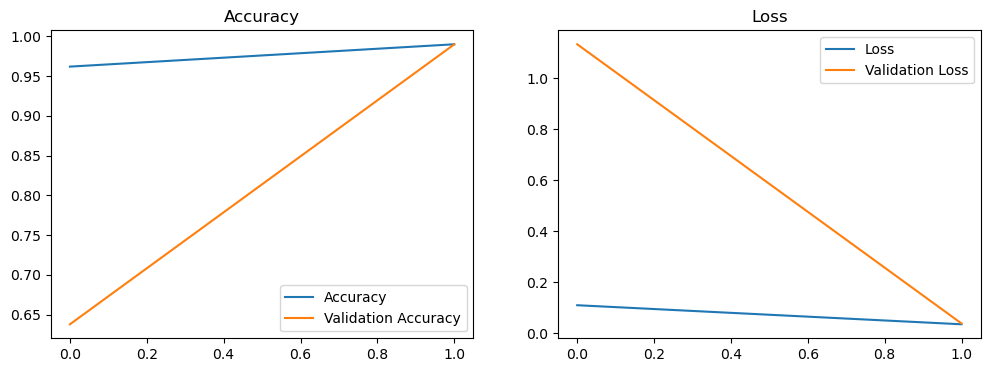

In [ ]:
#------loading saved model, dataGenParams, training history
import json, os
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# ----!!!!!----->Load model with correpsonding dataGenParams<-----!!!!!----
selected_dataGenParams = "dataGen_1"
resnet_1_model_dir = fr"C:\Users\User\DataScience\area51\models\resnet\resnet_1\{selected_dataGenParams}"

# loading model
model_path = os.path.join(resnet_1_model_dir, f'orientation_classifier_resnet_1_{selected_dataGenParams}.keras')
model = load_model(model_path)

# validation accuracy/loss
# v_path = os.path.join(resnet_1_model_dir, f'validation_accuracy_loss_resnet_1_{selected_dataGenParams}.json')
# with open(v_path, 'r') as f:
#     v_metrics = json.load(f)

# Load training history
history_path = os.path.join(resnet_1_model_dir, f'training_history_resnet_1_{selected_dataGenParams}.json')
with open(history_path, 'r') as f:
    history = json.load(f)


#----model summary
print(f"Data generator parameters are being used for training: {selected_dataGenParams}")
model.summary()

# Plot accuracy and loss
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history['accuracy'], label='Accuracy')
plt.plot(history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Accuracy')

plt.subplot(1, 2, 2)
plt.plot(history['loss'], label='Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Loss')

plt.show()

## Predict image orientation
    Step 1: Define the prediction function
    Step 2: Predict orientation for images
    Step 3: Store results

In [ ]:
import pandas as pd
import numpy as np
import os, cv2
from src.defs import DiseaseCategory as dc
import tensorflow.keras.models as models

# Step 1: Define the prediction function

def predict_orientation(img_path, model):
    
    # Load the image in grayscale
    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    
    # Resize to match model input
    img_resized = cv2.resize(img, (75, 75))
    img_resized = img_resized / 255.0  # Normalize pixel values
    
    # Expand dimensions to match model input shape (1, 75, 75, 1)
    img_input = np.expand_dims(img_resized, axis=[0, -1])

    # Get predictions
    prediction = model.predict(img_input)  # Shape: (1, 4)

    # Class index mapping from train_generator.class_indices
    index_to_orientation = {
        0: 'rotated_90',       # from folder 75x75_rotated_+90
        1: 'rotated_minus_90', # from folder 75x75_rotated_-90
        2: 'correct',          # from folder 75x75_rotated_0
        3: 'rotated_180'       # from folder 75x75_rotated_180
    }

    predicted_index = int(np.argmax(prediction[0]))
    confidence = float(prediction[0][predicted_index])
    orientation = index_to_orientation[predicted_index]

    return orientation, confidence

# specify parameter set of the data generator the model was trained with
selected_dataGenParams = "dataGen_1"

# load the model
model_dir = fr"C:\Users\User\DataScience\area51\models\resnet\resnet_1\{selected_dataGenParams}"
model_path = os.path.join(model_dir, f'orientation_classifier_resnet_1_{selected_dataGenParams}.keras')
model = models.load_model(model_path)

# Step 3: Predict orientation for all images in the dataset
for disease in dc:
    # images directory to predict the orientation
    image_dir = rf"C:\Users\User\DataScience\area51\data\COVID-19_Radiography_Dataset\{disease.value}\downscaled\75x75"
   
    results = []
    cnt = 0

    for img_name in os.listdir(image_dir):
        img_path = os.path.join(image_dir, img_name)
        orientation, confidence = predict_orientation(img_path, model)
        results.append({
            "Image": img_name,
            "Orientation": orientation,
            "Confidence": confidence,
            "Disesase": disease.value
        })

        cnt += 1

    # results to DataFrame
    df_results = pd.concat([df_results, pd.DataFrame(results)], ignore_index=True)

df_results = df_results.sort_values(by=["Disesase", "Image", "Orientation", "Confidence"]).reset_index(drop=True)

# 3: save to CSV
output_csv = os.path.join(model_dir, f"predicted_orientation_resnet_1_{selected_dataGenParams}.csv")
df_results.to_csv(output_csv, index=False)

In [10]:
#---loadind predicted data
def loadPredictedData(model_dir, selected_dataGenParams, sort_by=["Disesase", "Orientation", "Confidence"]):
    
    import pandas as pd, os

    df_predicted = pd.read_csv(os.path.join(model_dir, f"predicted_orientation_resnet_1_{selected_dataGenParams}.csv"))
    df_predicted = df_predicted.sort_values(by=sort_by).reset_index(drop=True)
    
    return df_predicted

from src.defs import DiseaseCategory
from src.utils.img_processing import ImageProcessor

ip = ImageProcessor()

# load predicted data
selected_dataGenParams = "dataGen_1"
model_dir = fr"C:\Users\User\DataScience\area51\models\resnet\resnet_1\{selected_dataGenParams}"
df_predicted = loadPredictedData(model_dir, selected_dataGenParams, sort_by=["Disesase","Orientation","Confidence"])
df_predicted.info()
df_predicted.head()    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21106 entries, 0 to 21105
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Image        21106 non-null  object 
 1   Orientation  21106 non-null  object 
 2   Confidence   21106 non-null  float64
 3   Disesase     21106 non-null  object 
dtypes: float64(1), object(3)
memory usage: 659.7+ KB


,Image,Orientation,Confidence,Disesase
0,75x75_COVID-1876.png,correct,0.337239,COVID
1,75x75_COVID-1881.png,correct,0.501824,COVID
2,75x75_COVID-445.png,correct,0.537060,COVID
3,75x75_COVID-604.png,correct,0.539163,COVID
4,75x75_COVID-1809.png,correct,0.542749,COVID


Viral Pneumonia --> Predicted orientation: rotated_90


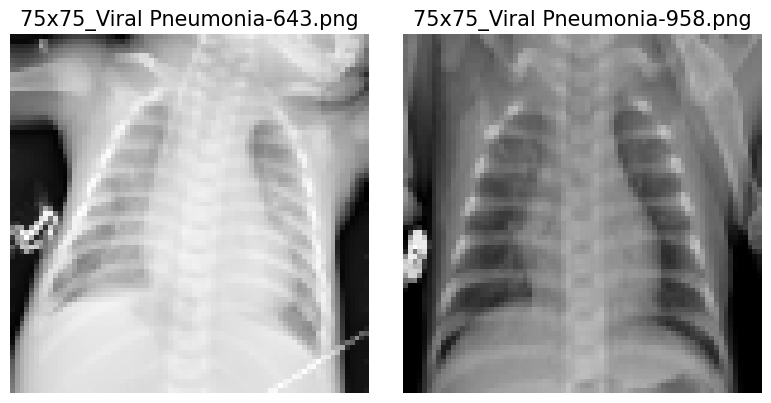

Viral Pneumonia --> Predicted orientation: rotated_minus_90


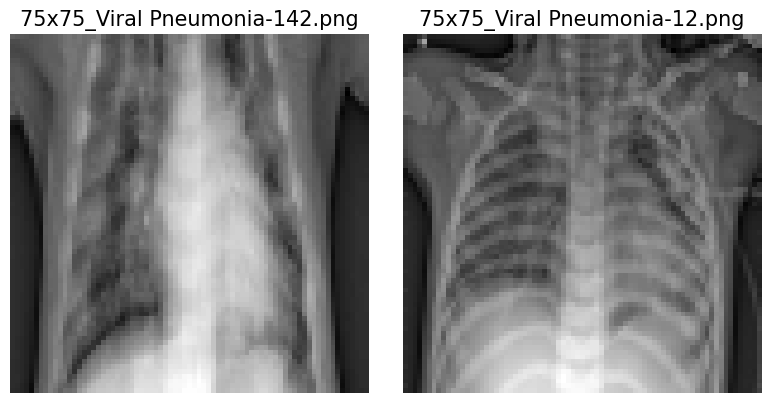

Viral Pneumonia --> Predicted orientation: rotated_180


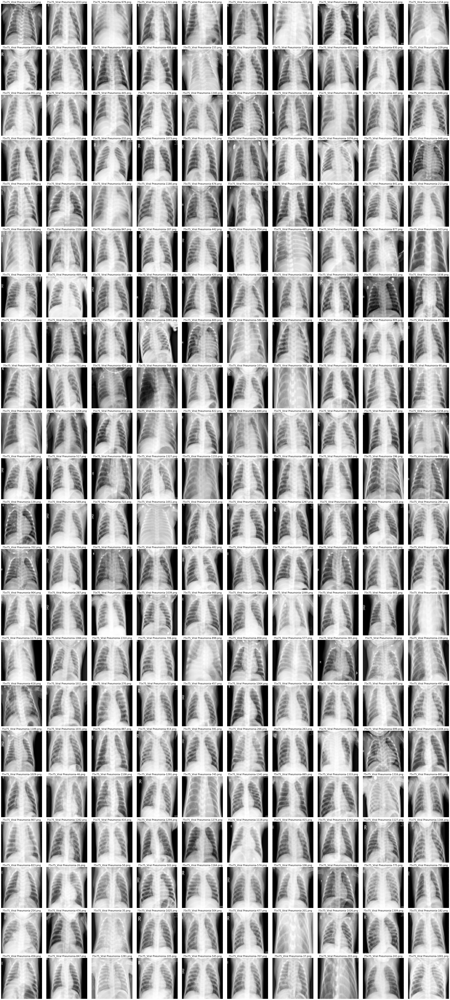

COVID --> Predicted orientation: rotated_90


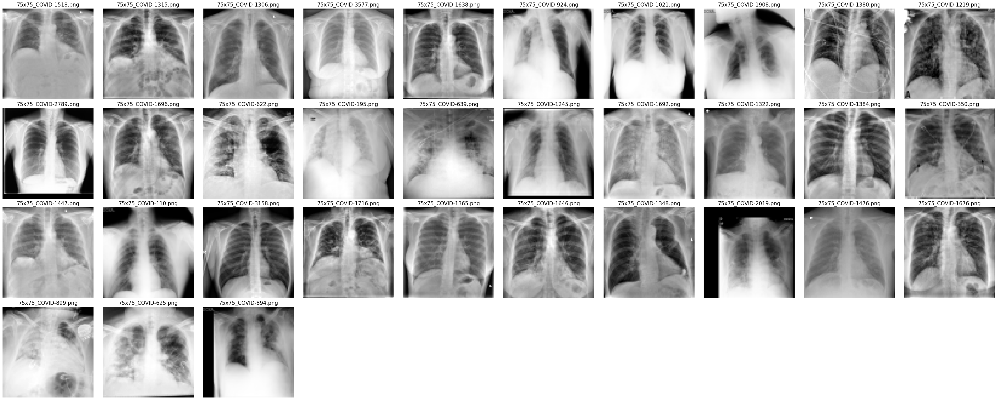

COVID --> Predicted orientation: rotated_minus_90


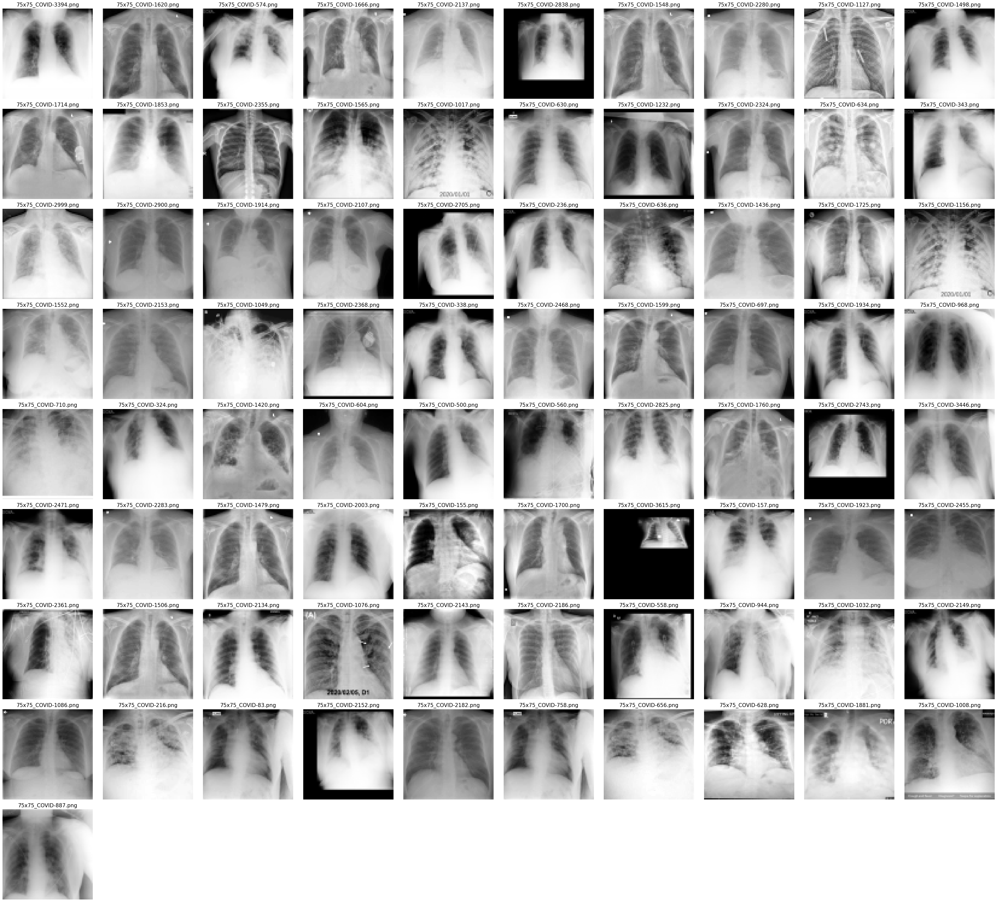

COVID --> Predicted orientation: rotated_180


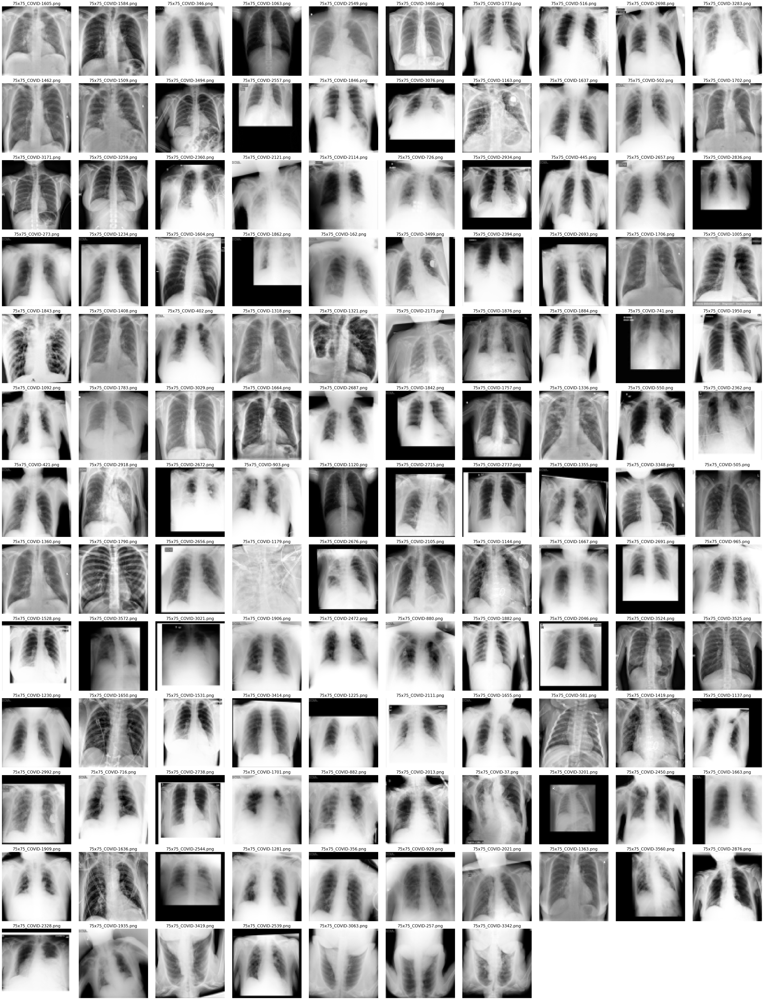

Lung_Opacity --> Predicted orientation: rotated_90


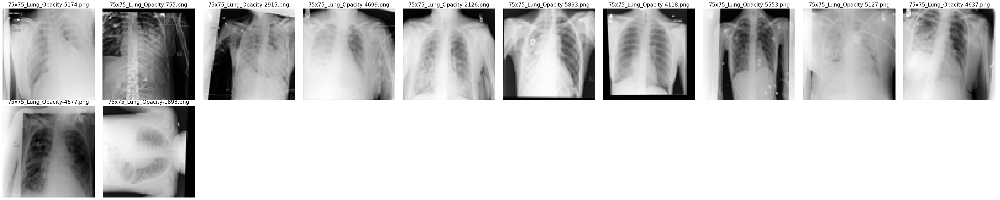

Lung_Opacity --> Predicted orientation: rotated_minus_90


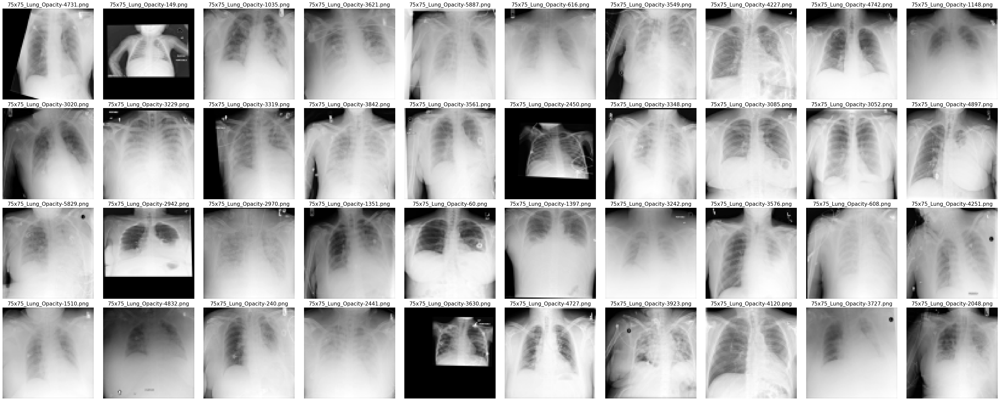

Lung_Opacity --> Predicted orientation: rotated_180


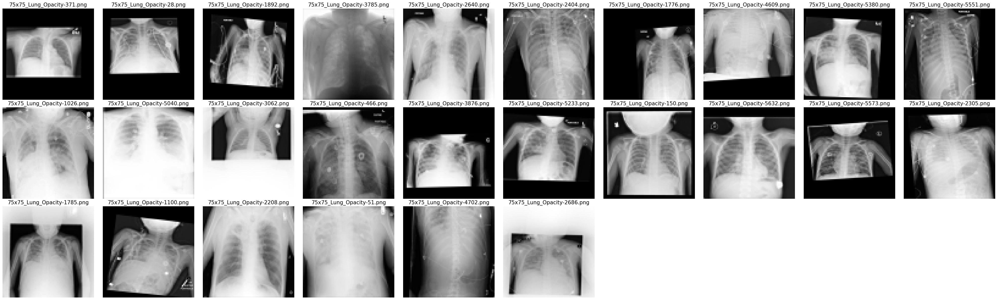

Normal --> Predicted orientation: rotated_90


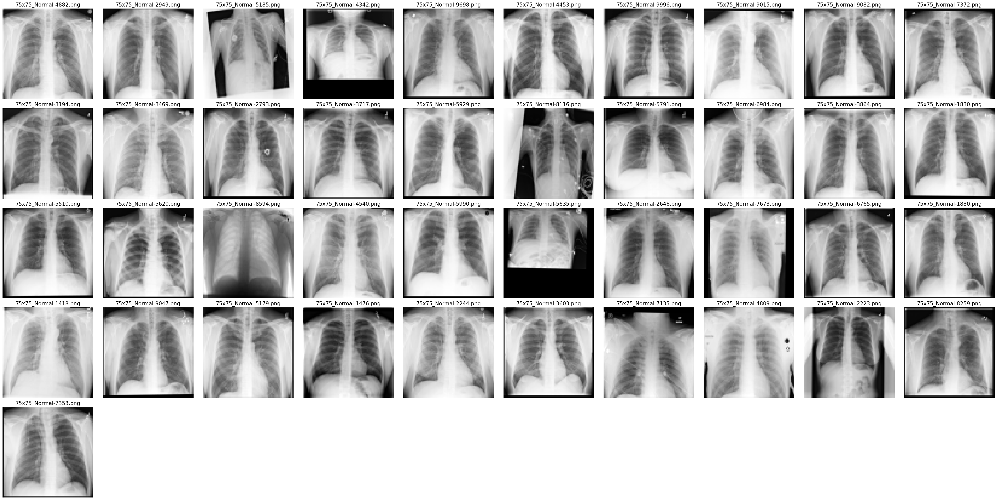

Normal --> Predicted orientation: rotated_minus_90


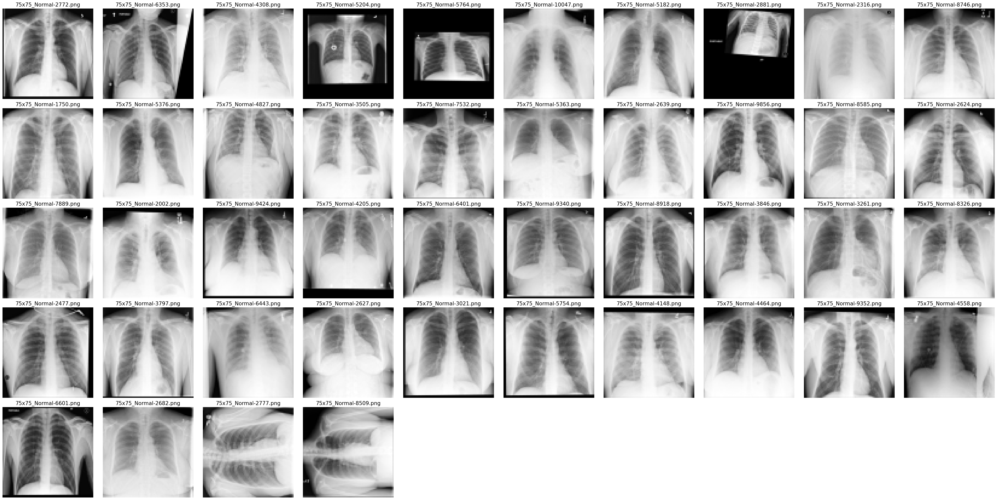

Normal --> Predicted orientation: rotated_180


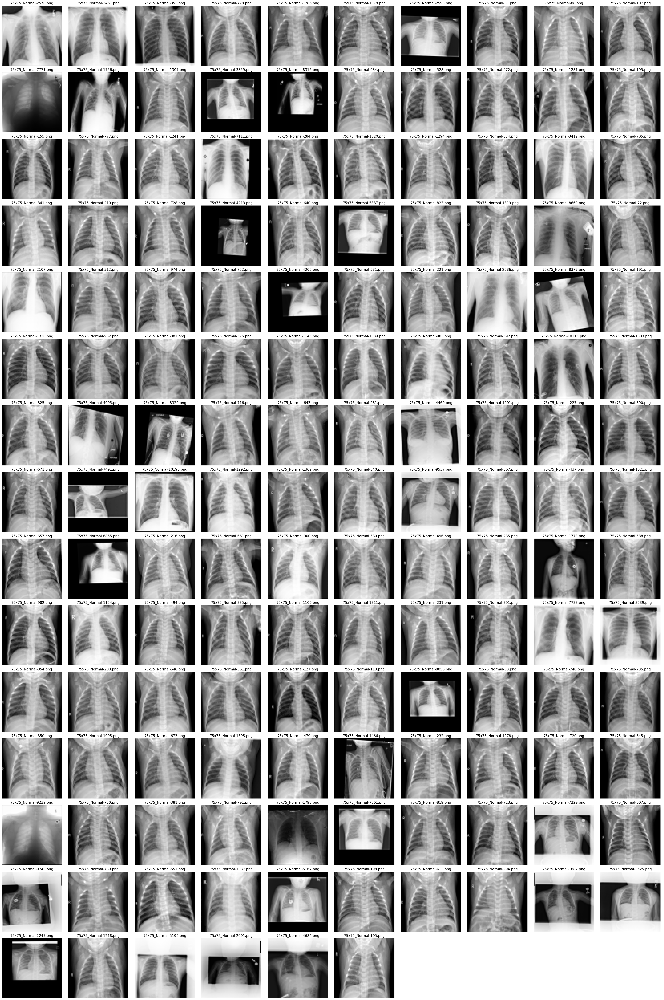

In [ ]:
# preview images predicted as rotated_90, rotated_minus_90, rotated_180
for cat in DiseaseCategory:
    for rot in ("rotated_90", "rotated_minus_90", "rotated_180"):
        img_dir = rf"C:\Users\User\DataScience\area51\data\COVID-19_Radiography_Dataset\{cat.value}\downscaled\75x75"
        i_names = df_predicted["Image"][(df_predicted["Disesase"]==cat.value) & (df_predicted["Orientation"] == rot) ].to_list()
        imgs, img_names = ip.loadImgs(i_names, img_dir)
        print(cat.value, "-->",f"Predicted orientation: {rot}")
        ip.plot_images(imgs, img_names, tSize=15, max_img_per_row=10)   
    